<a href="https://colab.research.google.com/github/AneeshYaramati/pothole-detection/blob/main/pothole_detection_new_code3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Install MMDetection**

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [2]:
!nvcc -V
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [3]:
!pip install -U torch==1.7.1+cu110 torchvision==0.8.2+cu110 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection
%cd mmdetection
!pip install -e .

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████                           | 180.4 MB 68.0 MB/s eta 0:00:15
ERROR: Operation cancelled by user
     |████████████████████████████████| 420 kB 21.2 MB/s 
     |████████████████████████████████| 190 kB 49.9 MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.4.4-cp37-cp37m-linux_x86_64.whl size=54622719 sha256=7ad64d6c508c29e4b6f9514e11c289da46a350a627f5addc41de0a47c9724337
  Stored in directory: /root/.cache/pip/wheels/95/8f/23/d7b471e373196d960c7eca09dad9c895b58213bcf6b743d0ed
Successfully built mmcv-full
Cloning into 'mmdetection'...
remote: Enumerating objects: 22938, done.
remote: Total 22938 (delta 0), reused 0 (delta 0), pack-reused 22938
Receiving objects: 100% (22938/22938), 25.74 MiB | 29.00 MiB/s, done.
Resolving deltas: 100% (16084/16084), done.
/content/mmdetection
Obtaining file:///content/mmdetection
  Running setup.py develop for mmdet


In [4]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

import mmdet
print(mmdet.__version__)

from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())
import os
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import glob
import cv2
import shutil
import random
import os.path as osp
import json
import mmcv
import random
import re
import xml.etree.ElementTree as ET
from typing import Dict, List
from mmdet.apis import set_random_seed
import pandas as pd
import numpy as np
from mmdet.apis import inference_detector, init_detector, show_result_pyplot

1.10.0+cu111 False
No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
2.20.0
not available
GCC 7.5


In [ ]:
!unzip '/gdrive/MyDrive/pothole/archive.zip' -d '/gdrive/MyDrive/pothole/'

Archive:  /gdrive/MyDrive/pothole/archive.zip
  inflating: /gdrive/MyDrive/pothole/README.md  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-1.jpg  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-1.xml  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-10.jpg  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-10.xml  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-100.jpg  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-100.xml  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-101.jpg  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-101.xml  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-102.jpg  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-102.xml  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-103.jpg  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-103.xml  
  inflating: /gdrive/MyDrive/pothole/annotated-images/img-104.jpg  
  inflating: /gdrive/MyDriv

In [ ]:
global_seed = 0

def set_seed(seed=global_seed):
    """Sets the random seeds."""
    set_random_seed(seed, deterministic=False)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)
    
set_seed()

In [ ]:
%cd /gdrive/MyDrive/pothole/annotated-images

/gdrive/MyDrive/pothole/annotated-images


# **Convert PASCAL VOC to COCO**

In [ ]:
with open('/gdrive/MyDrive/pothole/splits.json','r') as f:
    data = json.loads(f.read())

In [ ]:
%%writefile labels.txt
pothole

Writing labels.txt


In [ ]:
with open('train.txt', 'x') as f:
    for train_file in data['train']:
        f.write('/gdrive/MyDrive/pothole/annotated-images/' + train_file)
        f.write('\n')
f.close()

In [ ]:
with open('val.txt', 'x') as f:
    for val_file in data['test']:
        f.write('/gdrive/MyDrive/pothole/annotated-images/' + val_file)
        f.write('\n')
f.close()

In [ ]:
#Stolen from https://github.com/yukkyo/voc2coco
def get_label2id(labels_path: str) -> Dict[str, int]:
    with open(labels_path, 'r') as f:
        labels_str = f.read().split()
    labels_ids = list(range(1, len(labels_str)+1))
    return dict(zip(labels_str, labels_ids))


def get_annpaths(ann_dir_path: str = None,
                 ann_ids_path: str = None,
                 ext: str = '',
                 annpaths_list_path: str = None) -> List[str]:
    # If use annotation paths list
    if annpaths_list_path is not None:
        with open(annpaths_list_path, 'r') as f:
            ann_paths = f.read().split()
        return ann_paths

    # If use annotaion ids list
    ext_with_dot = '.' + ext if ext != '' else ''
    with open(ann_ids_path, 'r') as f:
        ann_ids = f.read().split()
    ann_paths = [os.path.join(ann_dir_path, aid+ext_with_dot) for aid in ann_ids]
    return ann_paths


def get_image_info(annotation_root, extract_num_from_imgid=True):
#     path = annotation_root.findtext('path')
#     if path is None:
    filename = annotation_root.findtext('filename')
#     else:
#         filename = os.path.basename(path)
    img_name = os.path.basename(filename)
    img_id = os.path.splitext(img_name)[0]
    if extract_num_from_imgid and isinstance(img_id, str):
        img_id = int(re.findall(r'\d+', img_id)[0])

    size = annotation_root.find('size')
    width = int(size.findtext('width'))
    height = int(size.findtext('height'))

    image_info = {
        'id': img_id,
        'width': width,
        'height': height,
        'file_name': filename,
    }
    return image_info


def get_coco_annotation_from_obj(obj, label2id):
    label = obj.findtext('name')
#     assert label in label2id, f"Error: {label} is not in label2id !"
    category_id = label2id[label]
    bndbox = obj.find('bndbox')
    xmin = int(float(bndbox.findtext('xmin')))
    ymin = int(float(bndbox.findtext('ymin')))
    xmax = int(float(bndbox.findtext('xmax')))
    ymax = int(float(bndbox.findtext('ymax')))
    assert xmax >= xmin and ymax >= ymin, f"Box size error !: (xmin, ymin, xmax, ymax): {xmin, ymin, xmax, ymax}"
    o_width = xmax - xmin
    o_height = ymax - ymin
    ann = {
        'category_id': category_id,
        'segmentation': [],  # This script is not for segmentation
        'area': o_width * o_height,
        'bbox': [xmin, ymin, o_width, o_height],
        'iscrowd': 0,
    }
    return ann


def convert_xmls_to_cocojson(annotation_paths: List[str],\
                             label2id: Dict[str, int],
                             output_jsonpath: str,
                             extract_num_from_imgid: bool = True):
    output_json_dict = {
        "images": [],
        "annotations": [],
        "categories": []
    }
    bnd_id = 1  # START_BOUNDING_BOX_ID, TODO input as args ?
    print('Start converting !')
    for a_path in annotation_paths:
        # Read annotation xml
        ann_tree = ET.parse(a_path)
        ann_root = ann_tree.getroot()

        img_info = get_image_info(annotation_root=ann_root,
                                  extract_num_from_imgid=extract_num_from_imgid)
        img_id = img_info['id']
        output_json_dict['images'].append(img_info)

        for obj in ann_root.findall('object'):
            ann = get_coco_annotation_from_obj(obj=obj, label2id=label2id)
            annot = {'id': bnd_id, 'image_id': img_id,}
            annot.update(ann)
            output_json_dict['annotations'].append(annot)
            bnd_id = bnd_id + 1

    for label, label_id in label2id.items():
        category_info = {'id': label_id, 'name': label, 'supercategory': 'none'}
        output_json_dict['categories'].append(category_info)

    with open(output_jsonpath, 'w') as f:
        output_json = json.dumps(output_json_dict)
        f.write(output_json)

In [ ]:
def convert_to_coco(ann_path_list='/gdrive/MyDrive/pothole/annotated-images/train.txt', labels='/gdrive/MyDrive/pothole/annotated-images/labels.txt', output='/gdrive/MyDrive/pothole/annotated-images/output.json'):
    label2id = get_label2id(labels_path=labels)
    ann_paths = get_annpaths(
        annpaths_list_path=ann_path_list
    )
    convert_xmls_to_cocojson(
        annotation_paths=ann_paths,
        label2id=label2id,
        output_jsonpath=output
    )

In [ ]:
convert_to_coco()

Start converting !


An interesting observation with this dataset is that there are some bboxes with the same xmin and xmax. 

In [ ]:
convert_to_coco(ann_path_list='/gdrive/MyDrive/pothole/annotated-images/val.txt', labels='/gdrive/MyDrive/pothole/annotated-images/labels.txt', output='/gdrive/MyDrive/pothole/annotated-images/val_output.json')

Start converting !


In [ ]:
from mmcv import Config
cfg = Config.fromfile('/content/mmdetection/configs/dcn/cascade_rcnn_r101_fpn_dconv_c3-c5_1x_coco.py')

In [ ]:
from mmdet.apis import set_random_seed

cfg.dataset_type = 'CocoDataset'
cfg.classes = '/gdrive/MyDrive/pothole/annotated-images/labels.txt'
cfg.data_root = '/gdrive/MyDrive/pothole/annotated-images'

for head in cfg.model.roi_head.bbox_head:
    head.num_classes = 1

cfg.data.test.type = 'CocoDataset'
cfg.data.test.classes = 'labels.txt'
cfg.data.test.data_root = '/gdrive/MyDrive/pothole/annotated-images'
cfg.data.test.ann_file = 'val_output.json'
cfg.data.test.img_prefix = '/gdrive/MyDrive/pothole/annotated-images'

cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = '/gdrive/MyDrive/pothole/annotated-images'
cfg.data.train.ann_file = 'output.json'
cfg.data.train.img_prefix = '/gdrive/MyDrive/pothole/annotated-images'
cfg.data.train.classes = 'labels.txt'

cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = '/gdrive/MyDrive/pothole/annotated-images'
cfg.data.val.ann_file = 'val_output.json'
cfg.data.val.img_prefix = '/gdrive/MyDrive/pothole/annotated-images'
cfg.data.val.classes = 'labels.txt'

albu_train_transforms = [
    dict(type='ShiftScaleRotate', shift_limit=0.0625,
         scale_limit=0.15, rotate_limit=15, p=0.4),
    dict(type='RandomBrightnessContrast', brightness_limit=0.2,
         contrast_limit=0.2, p=0.5),
    dict(type='IAAAffine', shear=(-10.0, 10.0), p=0.4),
#     dict(type='MixUp', p=0.2, lambd=0.5),
    dict(type="Blur", p=1.0, blur_limit=7),
    dict(type='CLAHE', p=0.5),
    dict(type='Equalize', mode='cv', p=0.4),
    dict(
        type="OneOf",
        transforms=[
            dict(type="GaussianBlur", p=1.0, blur_limit=7),
            dict(type="MedianBlur", p=1.0, blur_limit=7),
        ],
        p=0.4,
    ),]

cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='Resize', img_scale=(1333, 800), keep_ratio=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Albu',
        transforms=albu_train_transforms,
        bbox_params=dict(
        type='BboxParams',
        format='coco',
        label_fields=['gt_labels'],
        min_visibility=0.0,
        filter_lost_elements=True),
        keymap=dict(img='image', gt_bboxes='bboxes'),
        update_pad_shape=False,
        skip_img_without_anno=True),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]

cfg.load_from = '/gdrive/MyDrive/pothole/cascade_rcnn_r101_fpn_dconv_c3-c5_1x_coco_20200203-3b2f0594.pth'

cfg.work_dir = '/gdrive/MyDrive/pothole/annotated-images/model_output'

cfg.optimizer.lr = 0.02 / 8
cfg.lr_config = dict(
    policy='CosineAnnealing', 
    by_epoch=False,
    warmup='linear', 
    warmup_iters=500, 
    warmup_ratio=0.001,
    min_lr=1e-07)

cfg.data.samples_per_gpu = 4
cfg.data.workers_per_gpu = 2

cfg.evaluation.metric = 'bbox'
cfg.evaluation.interval = 4

cfg.checkpoint_config.interval = 12
cfg.runner.max_epochs = 36
cfg.log_config.interval = 50

cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = [0]

print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='CascadeRCNN',
    backbone=dict(
        type='ResNet',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained', checkpoint='torchvision://resnet101'),
        dcn=dict(type='DCN', deform_groups=1, fallback_on_stride=False),
        stage_with_dcn=(False, True, True, True)),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
     

In [ ]:
datasets = [build_dataset(cfg.data.train)]
model = build_detector(
 cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
model.CLASSES = datasets[0].CLASSES

mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


/kaggle/working/mmdetection/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '
2021-08-02 18:25:36,850 - mmdet - INFO - load checkpoint from ../input/dcn-checkpoint/cascade_rcnn_r101_fpn_dconv_c3-c5_1x_coco_20200203-3b2f0594.pth
2021-08-02 18:25:36,851 - mmdet - INFO - Use load_from_local loader


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2021-08-02 18:25:42,269 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.0.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.0.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.1.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.1.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.2.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.2.fc_cls.bias: copying 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 6.2 task/s, elapsed: 22s, ETA:     0s

2021-08-02 18:43:46,596 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-08-02 18:43:47,008 - mmdet - INFO - Epoch(val) [4][133]	bbox_mAP: 0.4890, bbox_mAP_50: 0.8060, bbox_mAP_75: 0.5200, bbox_mAP_s: 0.3000, bbox_mAP_m: 0.4240, bbox_mAP_l: 0.6240, bbox_mAP_copypaste: 0.489 0.806 0.520 0.300 0.424 0.624


DONE (t=0.30s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.489
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.806
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.520
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.424
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.624
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.606
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.606
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.606
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.463
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.566
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-08-02 18:45:31,300 - mmdet - INFO - Epoch [5][50/134]	lr: 2.410e-03, eta: 1:48:17, time: 2.085, data_time: 0.060, memory: 10455, loss_rpn_cls: 0.0070, loss_rpn_bbox: 0.0087, s0.loss_cls: 0.0665, s0.acc: 97.3877, s0.loss_bbox: 0.0408, s1.loss_cls: 0.0342, s1.acc: 97.3294, s1.loss_bbox: 0.0664, s2.loss_cls: 0.0191, s2.acc: 96.9652, s2.loss_bbox: 0.0539, loss: 0.2966
2021-08-02 18:47:06,837 - mmdet - INFO - Epoch [5][100/134]	lr: 2.395e-03, eta: 1:49:05, time: 1.911, data_time: 0.012, memory: 10455, loss_rpn_cls: 0.0062, loss_rpn_bbox: 0.0058, s0.loss_cls: 0.0635, s0.acc: 97.6631, s0.loss_bbox: 0.0344, s1.loss_cls: 0.0310, s1.acc: 97.8663, s1.loss_bbox: 0.0589, s2.loss_cls: 0.0173, s2.acc: 97.4531, s2.loss_bbox: 0.0497, loss: 0.2667
2021-08-02 18:49:53,536 - mmdet - INFO - Epoch [6][50/134]	lr: 2.365e-03, eta: 1:43:58, time: 2.009, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0041, loss_rpn_bbox: 0.0058, s0.loss_cls: 0.0542, s0.acc: 97.8643, s0.loss_bbox: 0.0301, s1.loss_cls: 0.0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 6.0 task/s, elapsed: 22s, ETA:     0s

2021-08-02 19:01:56,995 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.20s).
Accumulating evaluation results...


2021-08-02 19:01:57,242 - mmdet - INFO - Epoch(val) [8][133]	bbox_mAP: 0.5110, bbox_mAP_50: 0.8050, bbox_mAP_75: 0.5660, bbox_mAP_s: 0.3070, bbox_mAP_m: 0.4760, bbox_mAP_l: 0.6250, bbox_mAP_copypaste: 0.511 0.805 0.566 0.307 0.476 0.625


DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.805
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.566
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.307
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.476
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.625
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.609
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.609
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.609
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.456
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.586
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.702


2021-08-02 19:03:36,653 - mmdet - INFO - Epoch [9][50/134]	lr: 2.181e-03, eta: 1:33:19, time: 1.988, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0021, loss_rpn_bbox: 0.0049, s0.loss_cls: 0.0371, s0.acc: 98.5146, s0.loss_bbox: 0.0233, s1.loss_cls: 0.0170, s1.acc: 98.6688, s1.loss_bbox: 0.0463, s2.loss_cls: 0.0098, s2.acc: 98.6347, s2.loss_bbox: 0.0465, loss: 0.1869
2021-08-02 19:05:15,461 - mmdet - INFO - Epoch [9][100/134]	lr: 2.154e-03, eta: 1:33:15, time: 1.976, data_time: 0.013, memory: 10455, loss_rpn_cls: 0.0026, loss_rpn_bbox: 0.0058, s0.loss_cls: 0.0375, s0.acc: 98.5908, s0.loss_bbox: 0.0204, s1.loss_cls: 0.0168, s1.acc: 98.7794, s1.loss_bbox: 0.0405, s2.loss_cls: 0.0096, s2.acc: 98.5858, s2.loss_bbox: 0.0424, loss: 0.1755
2021-08-02 19:08:06,363 - mmdet - INFO - Epoch [10][50/134]	lr: 2.105e-03, eta: 1:29:53, time: 2.054, data_time: 0.060, memory: 10455, loss_rpn_cls: 0.0023, loss_rpn_bbox: 0.0053, s0.loss_cls: 0.0391, s0.acc: 98.5049, s0.loss_bbox: 0.0217, s1.loss_cls: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 5.9 task/s, elapsed: 22s, ETA:     0s

2021-08-02 19:20:07,870 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.17s).
Accumulating evaluation results...


2021-08-02 19:20:08,088 - mmdet - INFO - Epoch(val) [12][133]	bbox_mAP: 0.5130, bbox_mAP_50: 0.7960, bbox_mAP_75: 0.5640, bbox_mAP_s: 0.3170, bbox_mAP_m: 0.4640, bbox_mAP_l: 0.6390, bbox_mAP_copypaste: 0.513 0.796 0.564 0.317 0.464 0.639


DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.513
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.796
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.564
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.317
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.464
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.606
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.606
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.606
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.452
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.561
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.717


2021-08-02 19:21:46,289 - mmdet - INFO - Epoch [13][50/134]	lr: 1.840e-03, eta: 1:19:26, time: 1.964, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0013, loss_rpn_bbox: 0.0033, s0.loss_cls: 0.0275, s0.acc: 98.9072, s0.loss_bbox: 0.0146, s1.loss_cls: 0.0101, s1.acc: 99.2373, s1.loss_bbox: 0.0282, s2.loss_cls: 0.0052, s2.acc: 99.2757, s2.loss_bbox: 0.0306, loss: 0.1208
2021-08-02 19:23:27,271 - mmdet - INFO - Epoch [13][100/134]	lr: 1.804e-03, eta: 1:18:57, time: 2.020, data_time: 0.012, memory: 10455, loss_rpn_cls: 0.0011, loss_rpn_bbox: 0.0031, s0.loss_cls: 0.0221, s0.acc: 99.1113, s0.loss_bbox: 0.0118, s1.loss_cls: 0.0087, s1.acc: 99.3122, s1.loss_bbox: 0.0240, s2.loss_cls: 0.0042, s2.acc: 99.3924, s2.loss_bbox: 0.0276, loss: 0.1026
2021-08-02 19:26:17,450 - mmdet - INFO - Epoch [14][50/134]	lr: 1.742e-03, eta: 1:16:08, time: 2.068, data_time: 0.060, memory: 10455, loss_rpn_cls: 0.0010, loss_rpn_bbox: 0.0031, s0.loss_cls: 0.0259, s0.acc: 98.9785, s0.loss_bbox: 0.0135, s1.loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 5.9 task/s, elapsed: 23s, ETA:     0s

2021-08-02 19:38:14,727 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-08-02 19:38:14,925 - mmdet - INFO - Epoch(val) [16][133]	bbox_mAP: 0.5160, bbox_mAP_50: 0.7780, bbox_mAP_75: 0.5670, bbox_mAP_s: 0.3170, bbox_mAP_m: 0.4680, bbox_mAP_l: 0.6410, bbox_mAP_copypaste: 0.516 0.778 0.567 0.317 0.468 0.641


DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.516
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.317
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.468
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.641
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.598
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.598
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.598
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.428
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.562
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-08-02 19:39:56,078 - mmdet - INFO - Epoch [17][50/134]	lr: 1.428e-03, eta: 1:05:50, time: 2.023, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0007, loss_rpn_bbox: 0.0025, s0.loss_cls: 0.0212, s0.acc: 99.1748, s0.loss_bbox: 0.0098, s1.loss_cls: 0.0072, s1.acc: 99.4319, s1.loss_bbox: 0.0164, s2.loss_cls: 0.0032, s2.acc: 99.5258, s2.loss_bbox: 0.0185, loss: 0.0794
2021-08-02 19:41:34,713 - mmdet - INFO - Epoch [17][100/134]	lr: 1.387e-03, eta: 1:05:02, time: 1.973, data_time: 0.012, memory: 10455, loss_rpn_cls: 0.0007, loss_rpn_bbox: 0.0023, s0.loss_cls: 0.0201, s0.acc: 99.2061, s0.loss_bbox: 0.0093, s1.loss_cls: 0.0064, s1.acc: 99.5142, s1.loss_bbox: 0.0182, s2.loss_cls: 0.0031, s2.acc: 99.5593, s2.loss_bbox: 0.0208, loss: 0.0809
2021-08-02 19:44:17,053 - mmdet - INFO - Epoch [18][50/134]	lr: 1.319e-03, eta: 1:02:23, time: 1.940, data_time: 0.058, memory: 10455, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0019, s0.loss_cls: 0.0184, s0.acc: 99.2773, s0.loss_bbox: 0.0080, s1.loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 6.0 task/s, elapsed: 22s, ETA:     0s

2021-08-02 19:56:18,740 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-08-02 19:56:18,945 - mmdet - INFO - Epoch(val) [20][133]	bbox_mAP: 0.5160, bbox_mAP_50: 0.7930, bbox_mAP_75: 0.5640, bbox_mAP_s: 0.3130, bbox_mAP_m: 0.4760, bbox_mAP_l: 0.6350, bbox_mAP_copypaste: 0.516 0.793 0.564 0.313 0.476 0.635


DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.516
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.793
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.564
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.313
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.476
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.635
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.598
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.598
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.598
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.419
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.571
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-08-02 19:57:59,977 - mmdet - INFO - Epoch [21][50/134]	lr: 9.938e-04, eta: 0:52:12, time: 2.020, data_time: 0.058, memory: 10455, loss_rpn_cls: 0.0004, loss_rpn_bbox: 0.0017, s0.loss_cls: 0.0148, s0.acc: 99.4160, s0.loss_bbox: 0.0057, s1.loss_cls: 0.0050, s1.acc: 99.6288, s1.loss_bbox: 0.0099, s2.loss_cls: 0.0021, s2.acc: 99.6721, s2.loss_bbox: 0.0110, loss: 0.0507
2021-08-02 19:59:39,307 - mmdet - INFO - Epoch [21][100/134]	lr: 9.541e-04, eta: 0:51:15, time: 1.987, data_time: 0.012, memory: 10455, loss_rpn_cls: 0.0007, loss_rpn_bbox: 0.0020, s0.loss_cls: 0.0161, s0.acc: 99.3701, s0.loss_bbox: 0.0059, s1.loss_cls: 0.0053, s1.acc: 99.5751, s1.loss_bbox: 0.0104, s2.loss_cls: 0.0023, s2.acc: 99.6558, s2.loss_bbox: 0.0120, loss: 0.0546
2021-08-02 20:02:23,493 - mmdet - INFO - Epoch [22][50/134]	lr: 8.882e-04, eta: 0:48:50, time: 1.964, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0013, s0.loss_cls: 0.0141, s0.acc: 99.4551, s0.loss_bbox: 0.0051, s1.loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 6.0 task/s, elapsed: 22s, ETA:     0s

2021-08-02 20:14:27,274 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-08-02 20:14:27,460 - mmdet - INFO - Epoch(val) [24][133]	bbox_mAP: 0.5140, bbox_mAP_50: 0.7850, bbox_mAP_75: 0.5620, bbox_mAP_s: 0.3060, bbox_mAP_m: 0.4650, bbox_mAP_l: 0.6460, bbox_mAP_copypaste: 0.514 0.785 0.562 0.306 0.465 0.646


DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.514
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.785
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.465
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.646
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.560
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-08-02 20:16:08,247 - mmdet - INFO - Epoch [25][50/134]	lr: 5.909e-04, eta: 0:38:47, time: 2.015, data_time: 0.058, memory: 10455, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0015, s0.loss_cls: 0.0153, s0.acc: 99.3672, s0.loss_bbox: 0.0055, s1.loss_cls: 0.0048, s1.acc: 99.6204, s1.loss_bbox: 0.0071, s2.loss_cls: 0.0020, s2.acc: 99.7123, s2.loss_bbox: 0.0078, loss: 0.0445
2021-08-02 20:17:46,018 - mmdet - INFO - Epoch [25][100/134]	lr: 5.566e-04, eta: 0:37:43, time: 1.955, data_time: 0.013, memory: 10455, loss_rpn_cls: 0.0004, loss_rpn_bbox: 0.0014, s0.loss_cls: 0.0140, s0.acc: 99.4316, s0.loss_bbox: 0.0045, s1.loss_cls: 0.0045, s1.acc: 99.6334, s1.loss_bbox: 0.0072, s2.loss_cls: 0.0018, s2.acc: 99.7410, s2.loss_bbox: 0.0082, loss: 0.0419
2021-08-02 20:20:35,668 - mmdet - INFO - Epoch [26][50/134]	lr: 5.008e-04, eta: 0:35:27, time: 2.063, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0016, s0.loss_cls: 0.0138, s0.acc: 99.4531, s0.loss_bbox: 0.0049, s1.loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 6.0 task/s, elapsed: 22s, ETA:     0s

2021-08-02 20:32:32,572 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-08-02 20:32:32,755 - mmdet - INFO - Epoch(val) [28][133]	bbox_mAP: 0.5150, bbox_mAP_50: 0.7850, bbox_mAP_75: 0.5690, bbox_mAP_s: 0.3030, bbox_mAP_m: 0.4740, bbox_mAP_l: 0.6380, bbox_mAP_copypaste: 0.515 0.785 0.569 0.303 0.474 0.638


DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.515
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.785
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.569
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.303
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.474
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.638
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.592
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.592
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.592
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.408
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.565
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-08-02 20:34:10,970 - mmdet - INFO - Epoch [29][50/134]	lr: 2.674e-04, eta: 0:25:23, time: 1.964, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0014, s0.loss_cls: 0.0139, s0.acc: 99.4609, s0.loss_bbox: 0.0045, s1.loss_cls: 0.0043, s1.acc: 99.6726, s1.loss_bbox: 0.0067, s2.loss_cls: 0.0018, s2.acc: 99.7444, s2.loss_bbox: 0.0072, loss: 0.0401
2021-08-02 20:35:49,844 - mmdet - INFO - Epoch [29][100/134]	lr: 2.428e-04, eta: 0:24:14, time: 1.977, data_time: 0.013, memory: 10455, loss_rpn_cls: 0.0006, loss_rpn_bbox: 0.0016, s0.loss_cls: 0.0160, s0.acc: 99.3848, s0.loss_bbox: 0.0054, s1.loss_cls: 0.0050, s1.acc: 99.5867, s1.loss_bbox: 0.0066, s2.loss_cls: 0.0020, s2.acc: 99.7176, s2.loss_bbox: 0.0074, loss: 0.0446
2021-08-02 20:38:39,817 - mmdet - INFO - Epoch [30][50/134]	lr: 2.038e-04, eta: 0:22:03, time: 2.028, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0004, loss_rpn_bbox: 0.0015, s0.loss_cls: 0.0136, s0.acc: 99.4688, s0.loss_bbox: 0.0050, s1.loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 6.0 task/s, elapsed: 22s, ETA:     0s

2021-08-02 20:50:36,077 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-08-02 20:50:36,278 - mmdet - INFO - Epoch(val) [32][133]	bbox_mAP: 0.5140, bbox_mAP_50: 0.7850, bbox_mAP_75: 0.5680, bbox_mAP_s: 0.3010, bbox_mAP_m: 0.4710, bbox_mAP_l: 0.6400, bbox_mAP_copypaste: 0.514 0.785 0.568 0.301 0.471 0.640


DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.514
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.785
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.568
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.301
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.471
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.640
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.408
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.561
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-08-02 20:52:16,155 - mmdet - INFO - Epoch [33][50/134]	lr: 6.244e-05, eta: 0:12:03, time: 1.997, data_time: 0.058, memory: 10455, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0012, s0.loss_cls: 0.0125, s0.acc: 99.5225, s0.loss_bbox: 0.0039, s1.loss_cls: 0.0040, s1.acc: 99.6774, s1.loss_bbox: 0.0058, s2.loss_cls: 0.0016, s2.acc: 99.7560, s2.loss_bbox: 0.0065, loss: 0.0359
2021-08-02 20:53:55,447 - mmdet - INFO - Epoch [33][100/134]	lr: 5.038e-05, eta: 0:10:51, time: 1.986, data_time: 0.013, memory: 10455, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0017, s0.loss_cls: 0.0144, s0.acc: 99.4297, s0.loss_bbox: 0.0048, s1.loss_cls: 0.0047, s1.acc: 99.6357, s1.loss_bbox: 0.0070, s2.loss_cls: 0.0020, s2.acc: 99.6996, s2.loss_bbox: 0.0075, loss: 0.0426
2021-08-02 20:56:44,674 - mmdet - INFO - Epoch [34][50/134]	lr: 3.298e-05, eta: 0:08:44, time: 2.058, data_time: 0.059, memory: 10455, loss_rpn_cls: 0.0006, loss_rpn_bbox: 0.0016, s0.loss_cls: 0.0142, s0.acc: 99.4336, s0.loss_bbox: 0.0044, s1.loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 133/133, 5.9 task/s, elapsed: 22s, ETA:     0s

2021-08-02 21:08:43,032 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-08-02 21:08:43,227 - mmdet - INFO - Epoch(val) [36][133]	bbox_mAP: 0.5140, bbox_mAP_50: 0.7850, bbox_mAP_75: 0.5680, bbox_mAP_s: 0.3010, bbox_mAP_m: 0.4720, bbox_mAP_l: 0.6390, bbox_mAP_copypaste: 0.514 0.785 0.568 0.301 0.472 0.639


DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.514
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.785
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.568
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.301
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.472
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.408
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.562
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

Use load_from_local loader


/kaggle/working/mmdetection/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


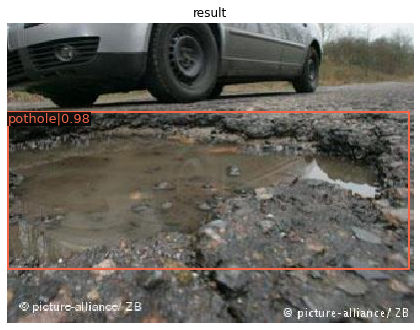

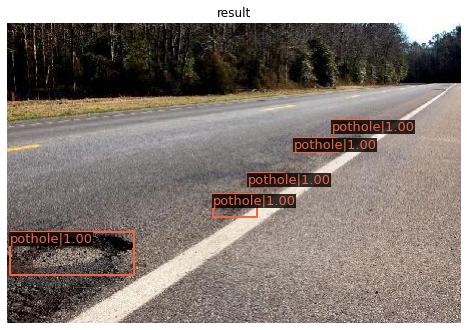

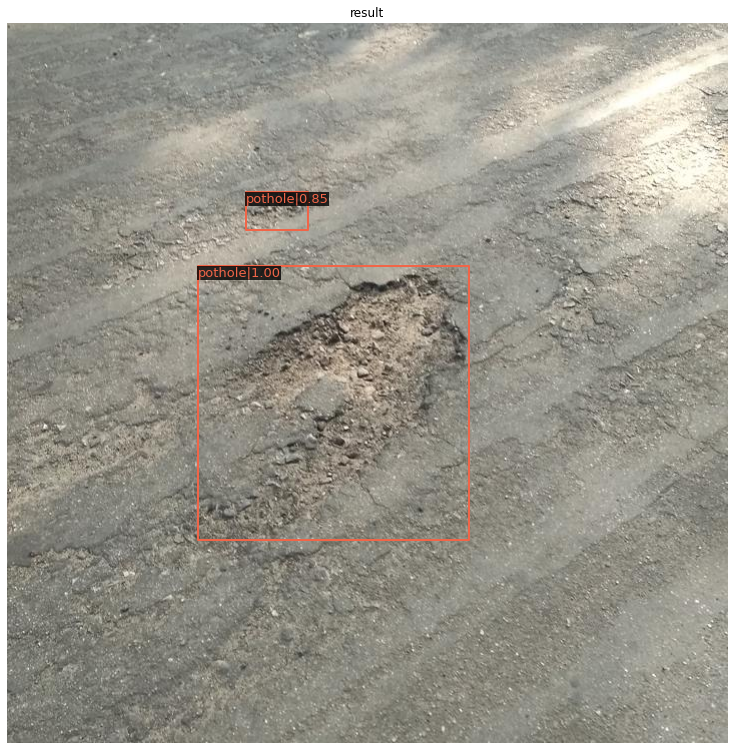

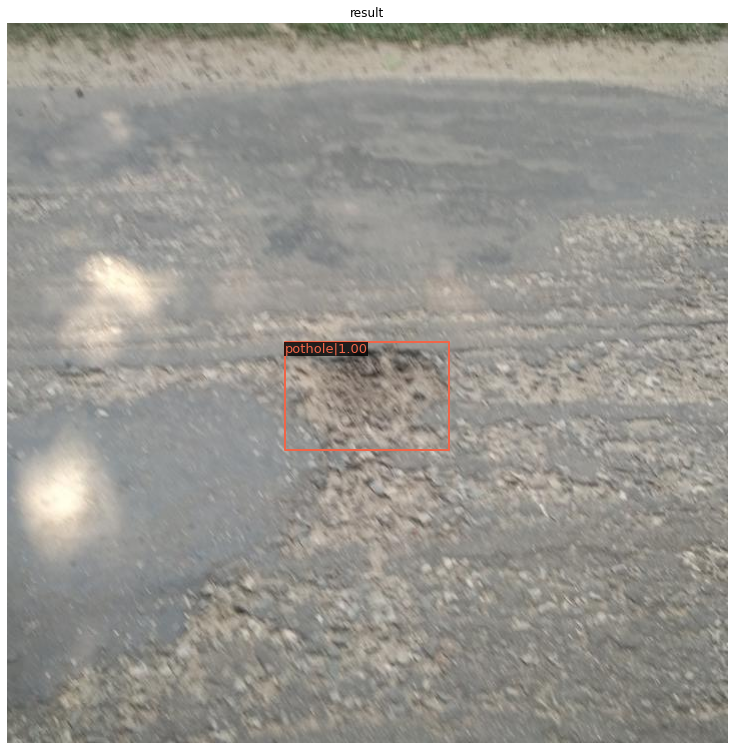

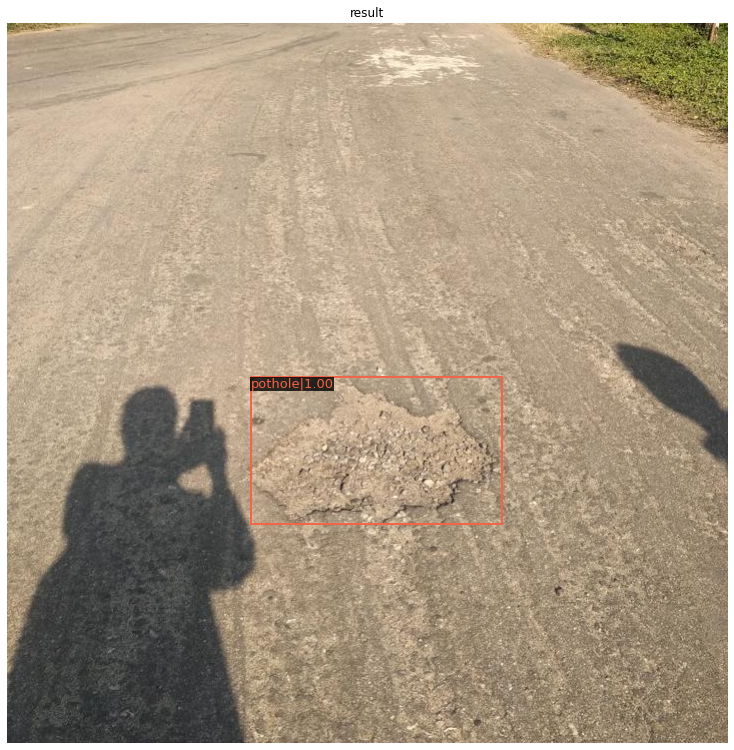

...

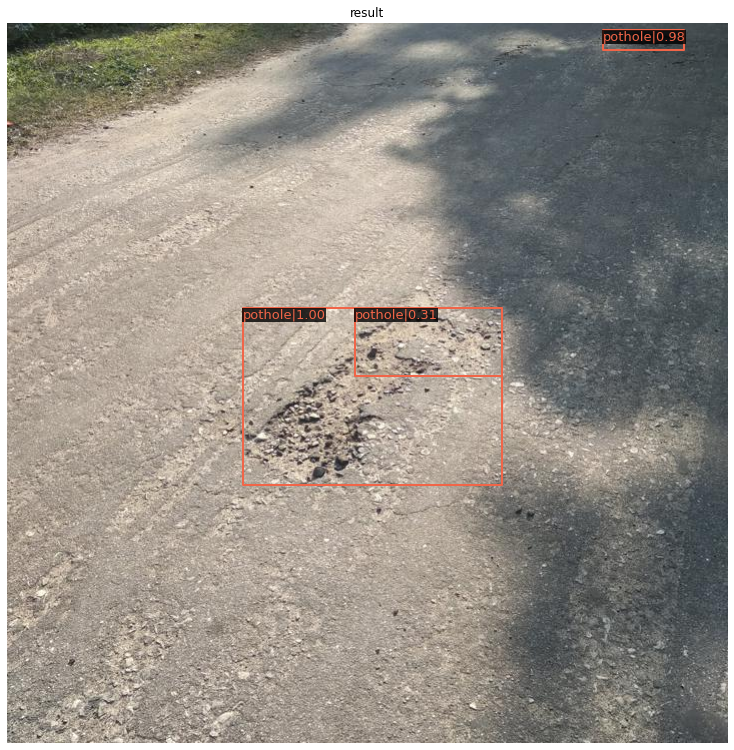

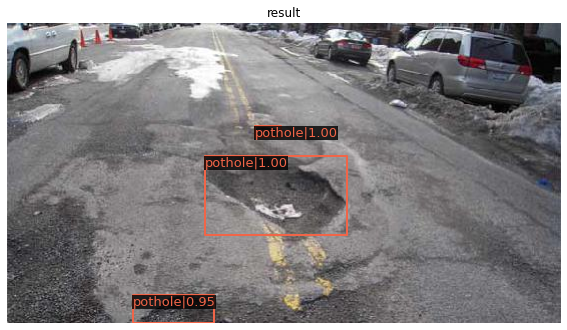

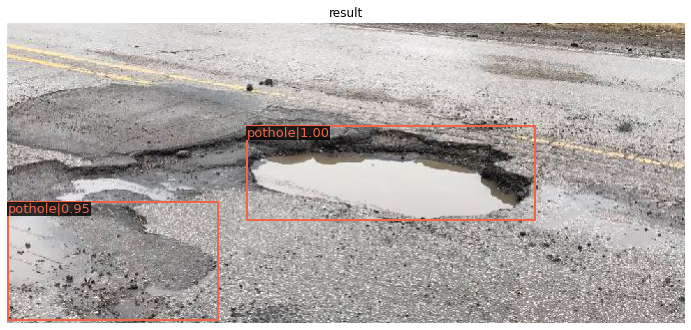

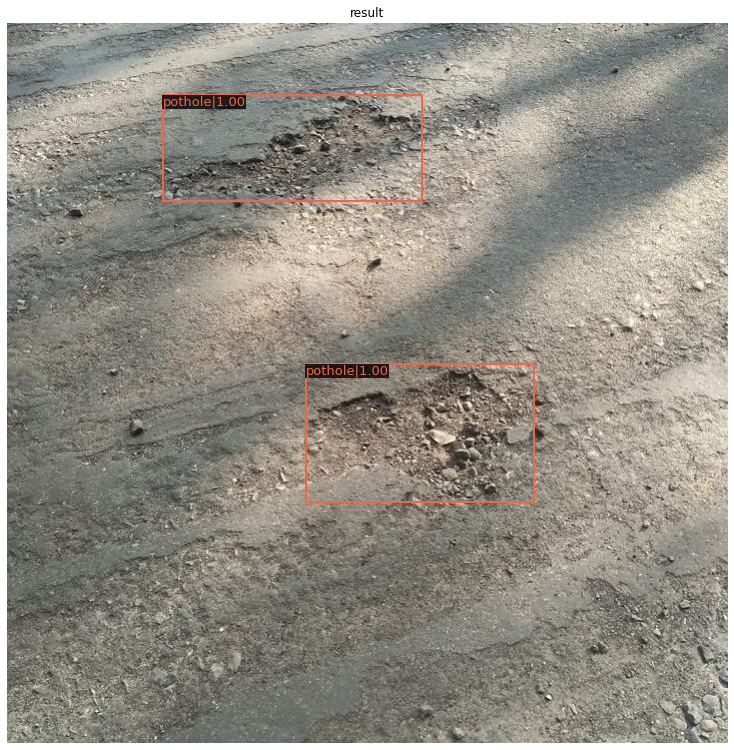

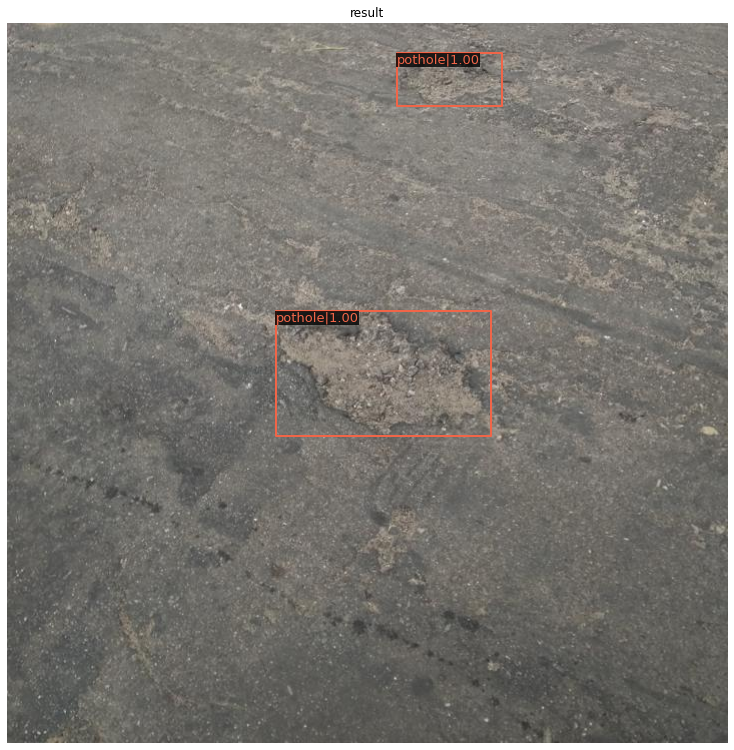

In [ ]:
model = init_detector(cfg, '/demo/working/model_output/epoch_36.pth')
for i in range(30):
    img = data['test'][i][:-3] + 'jpg'
    img = mmcv.imread('../input/annotated-potholes-dataset/annotated-images/' + img)
    result = inference_detector(model, img)
    show_result_pyplot(model, img, result)